In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import time
from sklearn.metrics import mean_squared_error as MSE
from datetime import datetime
import warnings
from math import sqrt
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from matplotlib.pylab import rcParams
import statsmodels.api as sm
from collections import Counter


warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
plt.style.use('ggplot')
%matplotlib inline

This data represents median monthly housing sales prices for 265 zip codes over the period of April 1996 through April 2018 as reported by Zillow.

Each row represents a unique zip code. Each record contains location info and median housing sales prices for each month.

There are 14,723 rows and 272 variables:

- **RegionID**: Unique index, 58196 through 753844   
- **RegionName**: Unique Zip Code, 1001 through 99901   
- **City**: City in which the zip code is located    
- **State**: State in which the zip code is located     
- **Metro**: Metropolitan Area in which the zip code is located      
- **CountyName**: County in which the zip code is located       
- **SizeRank**: Numerical rank of size of zip code, ranked 1 through 14723       
- **1996-04 through 2018-04**: refers to the median housing sales values for April 1996 through April 2018, that is 265 data points of monthly data for each zip code     

# Business Problem
Our client Steady has had great success with their sustainable housing community in King County. They are looking to create build a new community elsewhere in the state of Washington. They want the community to be affordable to first time home owners so they are looking at the best counties to invest in with homes that are 500,000 USD or less in value. 

In [2]:
df = pd.read_csv('zillow_data.csv')
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [3]:
df.describe()

,RegionID,RegionName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
count,14723.000000,14723.000000,14723.000000,1.368400e+04,1.368400e+04,1.368400e+04,1.368400e+04,1.368400e+04,1.368400e+04,1.368400e+04,...,1.472300e+04,1.472300e+04,1.472300e+04,1.472300e+04,1.472300e+04,1.472300e+04,1.472300e+04,1.472300e+04,1.472300e+04,1.472300e+04
mean,81075.010052,48222.348706,7362.000000,1.182991e+05,1.184190e+05,1.185374e+05,1.186531e+05,1.187803e+05,1.189275e+05,1.191205e+05,...,2.733354e+05,2.748658e+05,2.764646e+05,2.780332e+05,2.795209e+05,2.810953e+05,2.826571e+05,2.843687e+05,2.865114e+05,2.880399e+05
std,31934.118525,29359.325439,4250.308342,8.600251e+04,8.615567e+04,8.630923e+04,8.646795e+04,8.665094e+04,8.687208e+04,8.715185e+04,...,3.603984e+05,3.614678e+05,3.627563e+05,3.644610e+05,3.656003e+05,3.670454e+05,3.695727e+05,3.717739e+05,3.724612e+05,3.720544e+05
min,58196.000000,1001.000000,1.000000,1.130000e+04,1.150000e+04,1.160000e+04,1.180000e+04,1.180000e+04,1.200000e+04,1.210000e+04,...,1.440000e+04,1.450000e+04,1.470000e+04,1.480000e+04,1.450000e+04,1.430000e+04,1.410000e+04,1.390000e+04,1.380000e+04,1.380000e+04
25%,67174.500000,22101.500000,3681.500000,6.880000e+04,6.890000e+04,6.910000e+04,6.920000e+04,6.937500e+04,6.950000e+04,6.960000e+04,...,1.269000e+05,1.275000e+05,1.282000e+05,1.287000e+05,1.292500e+05,1.299000e+05,1.306000e+05,1.310500e+05,1.319500e+05,1.324000e+05
50%,78007.000000,46106.000000,7362.000000,9.950000e+04,9.950000e+04,9.970000e+04,9.970000e+04,9.980000e+04,9.990000e+04,9.995000e+04,...,1.884000e+05,1.896000e+05,1.905000e+05,1.914000e+05,1.925000e+05,1.934000e+05,1.941000e+05,1.950000e+05,1.967000e+05,1.981000e+05
75%,90920.500000,75205.500000,11042.500000,1.432000e+05,1.433000e+05,1.432250e+05,1.432250e+05,1.435000e+05,1.437000e+05,1.439000e+05,...,3.050000e+05,3.066500e+05,3.085000e+05,3.098000e+05,3.117000e+05,3.134000e+05,3.151000e+05,3.168500e+05,3.188500e+05,3.211000e+05
max,753844.000000,99901.000000,14723.000000,3.676700e+06,3.704200e+06,3.729600e+06,3.754600e+06,3.781800e+06,3.813500e+06,3.849600e+06,...,1.888990e+07,1.870350e+07,1.860530e+07,1.856940e+07,1.842880e+07,1.830710e+07,1.836590e+07,1.853040e+07,1.833770e+07,1.789490e+07


In [4]:
df.isna().sum()

RegionID         0
RegionName       0
City             0
State            0
Metro         1043
              ... 
2017-12          0
2018-01          0
2018-02          0
2018-03          0
2018-04          0
Length: 272, dtype: int64

In [5]:
df.dtypes

RegionID       int64
RegionName     int64
City          object
State         object
Metro         object
               ...  
2017-12        int64
2018-01        int64
2018-02        int64
2018-03        int64
2018-04        int64
Length: 272, dtype: object

### Exploring 'RegionID' 

It looks like RegionID is just a unique identifier. We will drop this column later since it doesn't provide additional information, just noise. 

In [6]:
# Starting analysis of first variable, RegionID
# 14723 unique values
print(df.RegionID.value_counts())
print(df.RegionID.nunique())

84654    1
60802    1
58299    1
63186    1
77596    1
        ..
67309    1
72802    1
74730    1
72705    1
95851    1
Name: RegionID, Length: 14723, dtype: int64
14723


### Exploring 'Region Name'
Region name is just the zipcode. We can see that there are 14,723 unique values for zip code. Let's rename this column to zip code for simplicity. 

In [7]:
# Now look at RegionName, this is the zip code

df.RegionName.value_counts() 

60657    1
7764     1
1226     1
13624    1
45335    1
        ..
22556    1
33761    1
38242    1
33602    1
89155    1
Name: RegionName, Length: 14723, dtype: int64

In [8]:
df = df.rename(columns={'RegionName':'Zipcode'})
df.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [9]:
#Change Zipcode dtype to 'str'
df[['Zipcode']] = df[['Zipcode']].astype('string')
df.dtypes

RegionID     int64
Zipcode     string
City        object
State       object
Metro       object
             ...  
2017-12      int64
2018-01      int64
2018-02      int64
2018-03      int64
2018-04      int64
Length: 272, dtype: object

### Exploring City
There are 7554 unique values

In [10]:
df.City.nunique()

7554

### Exploring State 
There are 51 states listed, including DC 

In [11]:
print(df.State.nunique())
print(df.State.unique())

51
['IL' 'TX' 'NY' 'CA' 'FL' 'TN' 'NC' 'GA' 'DC' 'MO' 'OK' 'AZ' 'NJ' 'MD'
 'VA' 'WA' 'OH' 'MI' 'MA' 'KS' 'NM' 'CT' 'NV' 'PA' 'CO' 'OR' 'IN' 'SC'
 'KY' 'AR' 'ND' 'MN' 'AL' 'DE' 'LA' 'MS' 'ID' 'MT' 'HI' 'WI' 'UT' 'ME'
 'SD' 'WV' 'IA' 'RI' 'NE' 'WY' 'AK' 'NH' 'VT']


### Exploring Metro 
There was only 1 missing value here, so it was filled with none. 

In [12]:
print(df.Metro.isnull().sum())

1043


In [13]:
print(df.Metro[14721])

nan


In [14]:
df.Metro.fillna('None', inplace=True)

### Exploring County Name
There are no missing values and the top three counties are Los Angeles, Jefferson, and Orange

In [15]:
df.CountyName.value_counts()

Los Angeles    264
Jefferson      175
Orange         166
Washington     164
Montgomery     159
              ... 
Uintah           1
Rains            1
Benewah          1
Pettis           1
Licking          1
Name: CountyName, Length: 1212, dtype: int64

In [16]:
df.CountyName.isna().sum()

0

### Exploring Size Rank 
Size rank is the numerical rank of the size of the zip code. Our top three zipcodes in size are 60657 (Chicago, IL), 75070 (McKinney, TX), and 77494 (Katy, TX). 

In [17]:
df[['Zipcode', 'SizeRank']].sort_values(by=['SizeRank'])

,Zipcode,SizeRank
0,60657,1
1,75070,2
2,77494,3
3,60614,4
4,79936,5
...,...,...
14718,1338,14719
14719,3293,14720
14720,40404,14721
14721,81225,14722


# Step 2: Data Preprocessing

For this project our client is specifically interested in Zipcodes in the state of Washington with a price ceiling of lower than 500,000USD

In [18]:
#selecting WA state zipcodes
df = df.loc[df['State']== 'WA'].reset_index()

#selecting homes valued at less than 500,000
df = df[df['2018-04']<=500000]

In [19]:
df.drop(['index', 'CountyName', 'State', 'Metro'], axis=1, inplace=True)
df.City.unique()

array(['Pasco', 'Vancouver', 'Spokane', 'Longview',
       'Seattle Hill-Silver Firs', 'Bellingham', 'Kennewick',
       'Federal Way', 'Bonney Lake', 'Marysville', 'Olympia',
       'Paine Field-Lake Stickney', 'Spanaway', 'Lake Stevens',
       'Moses Lake', 'Oak Harbor', 'Kent', 'Walla Walla', 'Yakima',
       'Wenatchee', 'Auburn', 'Renton', 'Lacey', 'Arlington', 'Sequim',
       'Shelton', 'Spokane Valley', 'Richland', 'Port Orchard',
       'Des Moines', 'South Hill', 'Bremerton', 'East Hill-Meridian',
       'Pullman', 'Everett', 'Ellensburg', 'Battle Ground', 'Poulsbo',
       'Parkland', 'Lakewood', 'Burien', 'Five Corners', 'Maple Valley',
       'University Place', 'Tumwater', 'Mount Vernon', 'Port Angeles',
       'East Wenatchee Bench', 'Camas', 'Tacoma', 'Puyallup',
       'Hazel Dell North', 'Centralia', 'Salmon Creek', 'Anacortes',
       'Kelso', 'Graham', 'Silverdale', 'Ferndale', 'Sedro-Woolley',
       'Seatac', 'Monroe', 'Yelm', 'Washougal', 'Bryn Mawr-Skyway',
   

### Exploring Sale Values 
Sale values are missing from 2014-06 back. To deal with some missing values I will drop anything before 1998-04 so that the dataset spans exactly 20 years. Then any rows that are missing values will be dropped. I believe dropping the rows rather than filling in missing values with the mean is better in this instance because we want our data to remain accurate and it's less than 10% of the data. 

Later on in this notebook we will be limiting the data to span only the last ten years. So the missing valies before 2008-10 will not be as signficant. 

In [20]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
print(df.isnull().sum())

RegionID    0
Zipcode     0
City        0
SizeRank    0
1996-04     5
1996-05     5
1996-06     5
1996-07     5
1996-08     5
1996-09     5
1996-10     5
1996-11     5
1996-12     5
1997-01     5
1997-02     5
1997-03     5
1997-04     5
1997-05     5
1997-06     5
1997-07     5
1997-08     5
1997-09     5
1997-10     5
1997-11     5
1997-12     5
1998-01     5
1998-02     5
1998-03     5
1998-04     5
1998-05     5
1998-06     5
1998-07     5
1998-08     5
1998-09     5
1998-10     5
1998-11     5
1998-12     5
1999-01     5
1999-02     5
1999-03     5
1999-04     5
1999-05     5
1999-06     5
1999-07     5
1999-08     5
1999-09     5
1999-10     5
1999-11     5
1999-12     5
2000-01     5
2000-02     5
2000-03     5
2000-04     5
2000-05     5
2000-06     5
2000-07     5
2000-08     5
2000-09     5
2000-10     5
2000-11     5
2000-12     5
2001-01     5
2001-02     5
2001-03     5
2001-04     5
2001-05     5
2001-06     5
2001-07     5
2001-08     5
2001-09     5
2001-10     5
2001-1

In [21]:
df.drop(['RegionID', '1996-04', '1996-05', '1996-06', '1996-07', '1996-08','1996-09', '1996-10', '1996-11', '1996-12', '1997-01','1997-02','1997-03', '1997-04', '1997-05', '1997-06', '1997-07', '1997-08', '1997-09', '1997-10', '1997-11','1997-12', '1998-01', '1998-02', '1998-03'], axis=1, inplace=True)
df.dropna()

,Zipcode,City,SizeRank,1998-04,1998-05,1998-06,1998-07,1998-08,1998-09,1998-10,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
3,99301,Pasco,181,85500.0,85000.0,84500.0,84100.0,83800.0,83800.0,84000.0,84300.0,84800.0,85700.0,86500.0,87200.0,87600.0,87700.0,87700.0,87800.0,88000.0,88300.0,88800.0,89400.0,90300.0,91500.0,92700.0,93700.0,94300.0,94500.0,94500.0,94300.0,93800.0,93200.0,92100.0,90600.0,88500.0,86300.0,84000.0,81500.0,79100.0,76900.0,75100.0,73800.0,72900.0,72500.0,72400.0,72500.0,73100.0,74100.0,75300.0,76500.0,77700.0,78900.0,80200.0,81600.0,83000.0,84200.0,85300.0,86400.0,86700.0,85300.0,83600.0,83500.0,85200.0,88400.0,92300.0,96400.0,100700.0,105100.0,109500.0,113400.0,116500.0,118700.0,119600.0,119200.0,118000.0,116600.0,115300.0,113900.0,112100.0,109600.0,107000.0,105000.0,104700.0,106800.0,111400.0,117700.0,124200.0,129600.0,133800.0,136700.0,139000.0,141000.0,143000.0,144900.0,146600.0,147800.0,148400.0,147800.0,146300.0,144500.0,143000.0,141800.0,141100.0,140500.0,140000.0,139300.0,138300.0,137000.0,135700.0,133900.0,131800.0,130000.0,128800.0,128000.0,127600.0,127600.0,127900.0,128500.0,129100.0,129700.0,130300.0,130600.0,130400.0,130000.0,129900.0,129700.0,129500.0,129400.0,129500.0,129600.0,129800.0,129800.0,130000.0,130000.0,129500.0,128800.0,128900.0,129600.0,131000.0,132600.0,134300.0,135700.0,137000.0,138800.0,139100.0,140800.0,145800.0,151400.0,154000.0,156300.0,157800.0,158900.0,159700.0,159900.0,159700.0,160000.0,160500.0,160100.0,159100.0,158200.0,157900.0,157600.0,157600.0,157600.0,157400.0,157700.0,159000.0,160300.0,161200.0,161400.0,161200.0,161200.0,161400.0,161300.0,161100.0,160700.0,160800.0,161100.0,160800.0,159900.0,159900.0,160500.0,160700.0,160600.0,161200.0,161300.0,161500.0,161600.0,161900.0,162600.0,163500.0,163700.0,163600.0,163600.0,163400.0,163100.0,163200.0,163900,164800,165500,165900,166100,166200,166800,167700,168300,168700,169200,169800,170400,171000,171800,173000,174100,174900,176000,178000,180200,182400,184700,187000,188700,189900,190600,191300,192200,192900,194100,196200,198500,200200,201700,203500,205400,207500,210100,212600,214200,216000,217600,218300,218100,217600
5,98682,Vancouver,

### EDA on Zipcodes 
Let's look at the 20 year, 10 year, 5 year, and 1 year ROI on each zipcode. ROI is equal to the (current price - the original price/original)*100. It's fascinating to see that the 20 year ROI have the largest values with New York, NY having 1017% ROI. While the highest 10 year ROI was 166% in Pittsburgh, PA. And the highest 5 year ROI was 173% in Denver, CO. It is expected that there be a relationship between time and ROI. Typically real estate increases in value naturally with time, however, for some reason the return on investment for the 10 year ROI was lower than the 5 year ROI. This is most likely due to the 2008 housing crisis. 

In [22]:
# Create 20 year, 10 year, 5 year, 3 year, and 1 year ROI 
df['20_yr_ROI'] = (df['2018-04'] - df['1998-04'])/(df['1998-04'])*100
df['10_yr_ROI'] = (df['2018-04'] - df['2008-04'])/(df['2008-04'])*100
df['5_yr_ROI'] = (df['2018-04'] - df['2013-04'])/(df['2013-04'])*100
df['1_yr_ROI'] = (df['2018-04'] - df['2017-04'])/(df['2017-04'])*100

### 20 Year ROI

#### Let's look at the zipcodes that had the highest 20 year ROI

In [23]:
df.sort_values('20_yr_ROI',ascending=False).head()[['Zipcode','20_yr_ROI']]

,Zipcode,20_yr_ROI
103,98146,230.040323
155,98043,220.094403
274,98359,215.767045
323,99181,211.345646
110,98405,203.303965


### 10 year ROI

#### Let's look at the zipcodes that had the highest 10 year ROI

In [24]:
df.sort_values('10_yr_ROI',ascending=False).head()[['Zipcode','10_yr_ROI']]

,Zipcode,10_yr_ROI
3,99301,66.871166
155,98043,50.746269
102,99337,48.781937
103,98146,47.035928
13,99336,46.987088


### 5 Year ROI

#### Let's look at the zipcodes that had the highest 5 year ROI

In [25]:
df.sort_values('5_yr_ROI',ascending=False).head()[['Zipcode','5_yr_ROI']]

,Zipcode,5_yr_ROI
77,98168,115.506849
155,98043,105.854293
103,98146,104.369538
278,98251,102.355316
259,98294,102.059202


### 1 Year ROI

#### Let's look at the zipcodes that had the highest 1 year ROI

In [26]:
df.sort_values('1_yr_ROI',ascending=False).head()[['Zipcode','1_yr_ROI']]

,Zipcode,1_yr_ROI
317,98568,35.667752
209,98550,29.835651
216,98611,25.567108
291,98570,24.351109
315,98356,24.025514


### Average one year ROI over the past 5 years 

In [27]:
# Let's look at the ROI from 2018, 2017, 2016, 2015, 2014 
# And average the 5 values together 
df['2017_ROI'] = (df['2017-04'] - df['2016-04'])/(df['2016-04'])*100 
df['2016_ROI'] = (df['2016-04'] - df['2015-04'])/(df['2015-04'])*100
df['2015_ROI'] = (df['2015-04'] - df['2014-04'])/(df['2014-04'])*100
df['2014_ROI'] = (df['2014-04'] - df['2013-04'])/(df['2013-04'])*100
df['avg_1_yr_ROI'] = ((df['1_yr_ROI'] + df['2017_ROI'] + df['2016_ROI'] + df['2015_ROI'] + df['2014_ROI'])/3)
df.drop(['2017_ROI', '2016_ROI', '2015_ROI', '2014_ROI'], axis=1, inplace=True)

df.head()

,Zipcode,City,SizeRank,1998-04,1998-05,1998-06,1998-07,1998-08,1998-09,1998-10,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,20_yr_ROI,10_yr_ROI,5_yr_ROI,1_yr_ROI,avg_1_yr_ROI
3,99301,Pasco,181,85500.0,85000.0,84500.0,84100.0,83800.0,83800.0,84000.0,84300.0,84800.0,85700.0,86500.0,87200.0,87600.0,87700.0,87700.0,87800.0,88000.0,88300.0,88800.0,89400.0,90300.0,91500.0,92700.0,93700.0,94300.0,94500.0,94500.0,94300.0,93800.0,93200.0,92100.0,90600.0,88500.0,86300.0,84000.0,81500.0,79100.0,76900.0,75100.0,73800.0,72900.0,72500.0,72400.0,72500.0,73100.0,74100.0,75300.0,76500.0,77700.0,78900.0,80200.0,81600.0,83000.0,84200.0,85300.0,86400.0,86700.0,85300.0,83600.0,83500.0,85200.0,88400.0,92300.0,96400.0,100700.0,105100.0,109500.0,113400.0,116500.0,118700.0,119600.0,119200.0,118000.0,116600.0,115300.0,113900.0,112100.0,109600.0,107000.0,105000.0,104700.0,106800.0,111400.0,117700.0,124200.0,129600.0,133800.0,136700.0,139000.0,141000.0,143000.0,144900.0,146600.0,147800.0,148400.0,147800.0,146300.0,144500.0,143000.0,141800.0,141100.0,140500.0,140000.0,139300.0,138300.0,137000.0,135700.0,133900.0,131800.0,130000.0,128800.0,128000.0,127600.0,127600.0,127900.0,128500.0,129100.0,129700.0,130300.0,130600.0,130400.0,130000.0,129900.0,129700.0,129500.0,129400.0,129500.0,129600.0,129800.0,129800.0,130000.0,130000.0,129500.0,128800.0,128900.0,129600.0,131000.0,132600.0,134300.0,135700.0,137000.0,138800.0,139100.0,140800.0,145800.0,151400.0,154000.0,156300.0,157800.0,158900.0,159700.0,159900.0,159700.0,160000.0,160500.0,160100.0,159100.0,158200.0,157900.0,157600.0,157600.0,157600.0,157400.0,157700.0,159000.0,160300.0,161200.0,161400.0,161200.0,161200.0,161400.0,161300.0,161100.0,160700.0,160800.0,161100.0,160800.0,159900.0,159900.0,160500.0,160700.0,160600.0,161200.0,161300.0,161500.0,161600.0,161900.0,162600.0,163500.0,163700.0,163600.0,163600.0,163400.0,163100.0,163200.0,163900,164800,165500,165900,166100,166200,166800,167700,168300,168700,169200,169800,170400,171000,171800,173000,174100,174900,176000,178000,180200,182400,184700,187000,188700,189900,190600,191300,192200,192900,194100,196200,198500,200200,201700,203500,205400,207500,210100,212600,214200,21

In [28]:
#sorting top zipcodes by average ROI value over the last 5 years
df.sort_values('avg_1_yr_ROI',ascending=False).head()[['Zipcode','avg_1_yr_ROI']]

,Zipcode,avg_1_yr_ROI
77,98168,27.782655
155,98043,25.962773
103,98146,25.778959
278,98251,25.359544
259,98294,25.208993


# Step 3: EDA and Visualization

Washington State
- This firm is interested particularily in the Washington state area. 
- They are interested in zipcodes that fall under the price ceiling of 500,000USD 
- They would like to look at the top 5 zipcodes that meet this criteria

In [29]:
#Dropping all ROI columns except the average 1 year ROI 
#Dropping all Zipcodes except our top 5 
df.drop(['20_yr_ROI', '10_yr_ROI', '5_yr_ROI', '1_yr_ROI'], axis=1, inplace=True)
print(df.columns)

Index(['Zipcode', 'City', 'SizeRank', '1998-04', '1998-05', '1998-06', '1998-07', '1998-08', '1998-09', '1998-10',
       ...
       '2017-08', '2017-09', '2017-10', '2017-11', '2017-12', '2018-01', '2018-02', '2018-03', '2018-04', 'avg_1_yr_ROI'], dtype='object', length=245)


#### Date Indexing 
When working with time series data in Python it is helpful to have the dates in the index. We will be modifying the dataset to have the dates indexed. 

In [30]:
def melt_data(df):
    melted = pd.melt(df, id_vars=['Zipcode', 'City', 'SizeRank', 'avg_1_yr_ROI'], 
                     var_name='Date')
    melted['Date'] = pd.to_datetime(melted['Date'], infer_datetime_format=True)
    melted = melted.dropna(subset=['value'])
    return melted

In [31]:
df = melt_data(df)
df.head()

,Zipcode,City,SizeRank,avg_1_yr_ROI,Date,value
0,99301,Pasco,181,10.498243,1998-04-01,85500.0
1,98682,Vancouver,381,18.251843,1998-04-01,131800.0
2,99208,Spokane,405,13.190207,1998-04-01,115200.0
3,98632,Longview,447,15.792835,1998-04-01,113400.0
4,98208,Seattle Hill-Silver Firs,518,20.070700,1998-04-01,178500.0


In [32]:
df.describe()

,SizeRank,avg_1_yr_ROI,value
count,64497.000000,64497.000000,64497.000000
mean,6987.012528,14.967176,201838.020373
std,4020.105448,4.218625,75484.116509
min,181.000000,4.737010,37800.000000
25%,3654.000000,12.136489,143600.000000
50%,7048.000000,14.623185,191400.000000
75%,10300.000000,17.456740,250700.000000
max,14677.000000,27.782655,495200.000000


In [33]:
import plotly.express as px
fig = px.box(df, y='value', points="all")

fig.show()

In [34]:
#removing outliers from sale value
q_low = df["value"].quantile(0.01)
q_hi  = df["value"].quantile(0.99)

df = df[(df["value"] < q_hi) & (df["value"] > q_low)]
df.describe()

,SizeRank,avg_1_yr_ROI,value
count,63205.000000,63205.000000,63205.000000
mean,6941.268128,15.008250,200931.793371
std,4008.352310,4.194305,71319.554543
min,181.000000,4.737010,72000.000000
25%,3654.000000,12.150465,144600.000000
50%,6859.000000,14.631561,191400.000000
75%,10300.000000,17.456740,249200.000000
max,14677.000000,27.782655,402500.000000


In [35]:
# Make sure the data type of the 'Date' column is datetime
df['Date'] = pd.to_datetime(df['Date'], format='%m/%y')

# Set the 'Date' column as index
df.set_index('Date', inplace=True)


#### Time-series Index Slicing for Data Selection

- Given the 2008 Housing Bubble precedent, I have decided to slice the dates and start my analysis at April 2013. This leaves us with a 10 year time window.



In [36]:
#limiting the dataset to the most recent 5 years to account for the skew due to the recession
df = df['2013-04-01':]

#### Resampling
- Let's group the data bucket into 1 months basis   
- Get the monthly average by calling the .mean() method  

In [37]:
df.resample('MS').mean().index

DatetimeIndex(['2013-04-01', '2013-05-01', '2013-06-01', '2013-07-01', '2013-08-01', '2013-09-01', '2013-10-01', '2013-11-01', '2013-12-01', '2014-01-01', '2014-02-01', '2014-03-01', '2014-04-01', '2014-05-01', '2014-06-01', '2014-07-01', '2014-08-01', '2014-09-01', '2014-10-01', '2014-11-01', '2014-12-01', '2015-01-01', '2015-02-01', '2015-03-01', '2015-04-01', '2015-05-01', '2015-06-01', '2015-07-01', '2015-08-01', '2015-09-01', '2015-10-01', '2015-11-01', '2015-12-01', '2016-01-01', '2016-02-01', '2016-03-01', '2016-04-01', '2016-05-01', '2016-06-01', '2016-07-01', '2016-08-01', '2016-09-01', '2016-10-01', '2016-11-01', '2016-12-01', '2017-01-01', '2017-02-01', '2017-03-01', '2017-04-01', '2017-05-01', '2017-06-01', '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01', '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01', '2018-03-01', '2018-04-01'], dtype='datetime64[ns]', name='Date', freq='MS')

In [38]:
df.isna().sum()

Zipcode         0
City            0
SizeRank        0
avg_1_yr_ROI    0
value           0
dtype: int64

In [39]:
# Perform backward filling of missing values
df = df.bfill()

# Find the total number of missing values in the time series
df.isna().sum()

Zipcode         0
City            0
SizeRank        0
avg_1_yr_ROI    0
value           0
dtype: int64

### Top 5 Zipcode Analysis

Let's visualize each of our top zipcodes and run a Dickey-Fuller test. This is a statistical test that test for stationarity. Our null hypothesis in this case is that the time series is not stationary. So if the test statistic result is less than the critical value then the null hypothesis can be rejected and we can say the series is stationary. 

We can also see from our previous plot that all the zipcodes express an upward linear trend. We will need to attempt to detrend the series by subtracting the weighted rolling mean. Using a weighted rolling mean is advantageous in series where a window cannot be strictly defined. Weighted rolling mean (or weighted moving average, WMA for short) gives more recent value a high weight. 

In [40]:
#creating a dataframe that contains just zipcode and value
df_zip = df[['Zipcode', 'value']]
df_zip.head()

,Zipcode,value
Date,,
2013-04-01,99301,160700.0
2013-04-01,98682,181600.0
2013-04-01,99208,172300.0
2013-04-01,98632,142300.0
2013-04-01,98208,268100.0


In [41]:
#Creating a dataframe for each of our top 5 zips 

zip_98168 = df_zip[df_zip['Zipcode']=='98168']
zip_98043 = df_zip[df_zip['Zipcode']=='98043']
zip_98146 = df_zip[df_zip['Zipcode']=='98146']
zip_98251 = df_zip[df_zip['Zipcode']=='98251']
zip_98294 = df_zip[df_zip['Zipcode']=='98294']

zip_98168.drop(['Zipcode'], axis=1, inplace=True)
zip_98043.drop(['Zipcode'], axis=1, inplace=True)
zip_98146.drop(['Zipcode'], axis=1, inplace=True)
zip_98251.drop(['Zipcode'], axis=1, inplace=True)
zip_98294.drop(['Zipcode'], axis=1, inplace=True)

In [42]:
zip_all = [zip_98168, zip_98043, zip_98146, zip_98251, zip_98294]
zip_names = ['98168', '98043', '98146', '98251', '98294']
zip_df = pd.concat(zip_all, axis = 1)
zip_df.columns = zip_names
zip_df.head()

,98168,98043,98146,98251,98294
Date,,,,,
2013-04-01,182500.0,230600.0,240300.0,148600.0,155400.0
2013-05-01,184700.0,233800.0,244900.0,155100.0,159800.0
2013-06-01,187700.0,237600.0,249400.0,160700.0,165100.0
2013-07-01,191800.0,241900.0,253600.0,164300.0,170300.0
2013-08-01,194800.0,245000.0,256400.0,166600.0,172900.0


In [43]:
# Perform backward filling of missing values
zip_df['98043'] = zip_df['98043'].ffill()
zip_df['98146'] = zip_df['98146'].ffill()
# Find the total number of missing values in the time series
zip_df.isna().sum()

98168    0
98043    0
98146    0
98251    0
98294    0
dtype: int64

In [44]:
zip_df.corr()

,98168,98043,98146,98251,98294
98168,1.000000,0.984052,0.969387,0.989062,0.998381
98043,0.984052,1.000000,0.990622,0.956152,0.983613
98146,0.969387,0.990622,1.000000,0.933937,0.971146
98251,0.989062,0.956152,0.933937,1.000000,0.990333
98294,0.998381,0.983613,0.971146,0.990333,1.000000


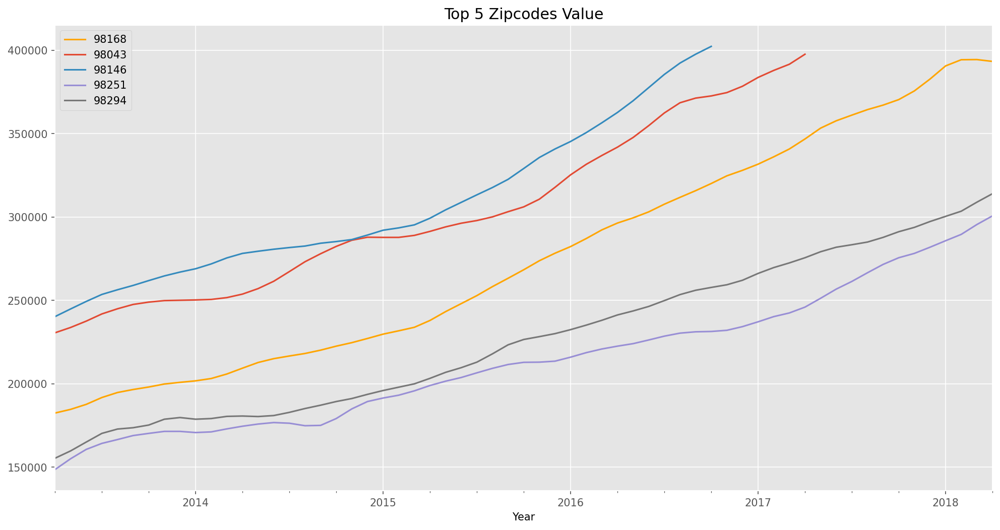

In [45]:
# code
# Visualizing The Value of the Top Five Zip Codes
  
# to set the plot size
plt.figure(figsize=(16, 8), dpi=150)
  
# using plot method to plot open prices.
# in plot method we set the label and color of the curve.
zip_98168['value'].plot(label='98168', color='orange')
zip_98043['value'].plot(label='98043')
zip_98146['value'].plot(label='98146')
zip_98251['value'].plot(label='98251')
zip_98294['value'].plot(label='98294')
  
# adding title to the plot
plt.title('Top 5 Zipcodes Value')
  
# adding Label to the x-axis
plt.xlabel('Year')
  
# adding legend to the curve
plt.legend()

#### zip_98168
Let's take a look at zipcode 98168. The p-value is 0.94 which is not less than our critical value of -2.91, meaning the series is not stationary. 

In [46]:
from statsmodels.tsa.stattools import adfuller

# Perform Dickey-Fuller test:
print ('Results of Dickey-Fuller Test: \n')
dftest = adfuller(zip_98168['value'])

# Extract and display test results in a user friendly manner
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Results of Dickey-Fuller Test: 

Test Statistic                 -0.167287
p-value                         0.942310
#Lags Used                      6.000000
Number of Observations Used    54.000000
Critical Value (1%)            -3.557709
Critical Value (5%)            -2.916770
Critical Value (10%)           -2.596222
dtype: float64


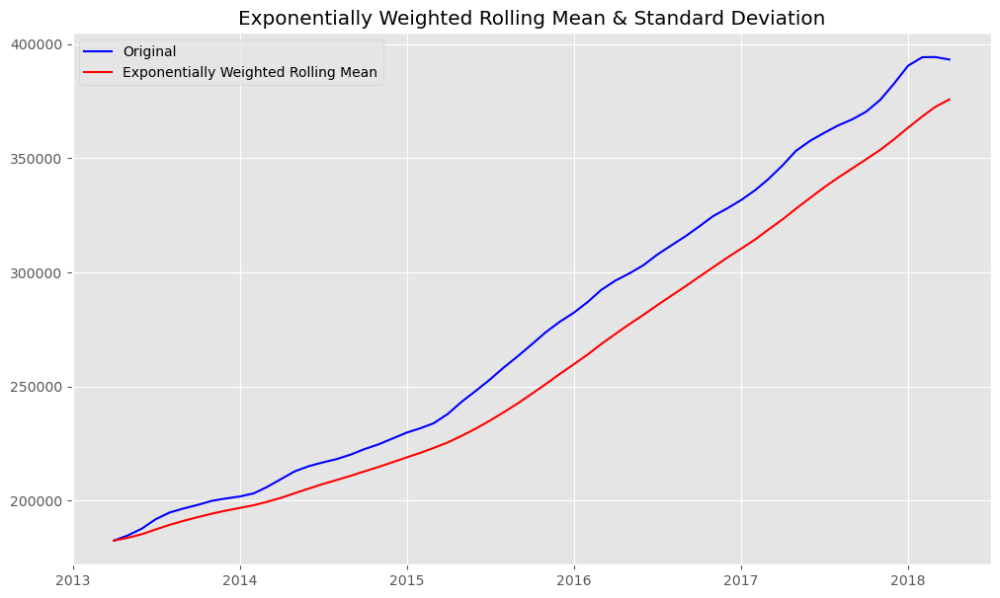

In [47]:
# Use Pandas ewm() to calculate Exponential Weighted Moving Average
exp_roll_mean = zip_98168.ewm(halflife=4).mean()

# Plot the original data with exp weighted average
fig = plt.figure(figsize=(12,7))
orig = plt.plot(zip_98168, color='blue',label='Original')
mean = plt.plot(exp_roll_mean, color='red', label='Exponentially Weighted Rolling Mean')
plt.legend(loc='best')
plt.title('Exponentially Weighted Rolling Mean & Standard Deviation')
plt.show(block=False)

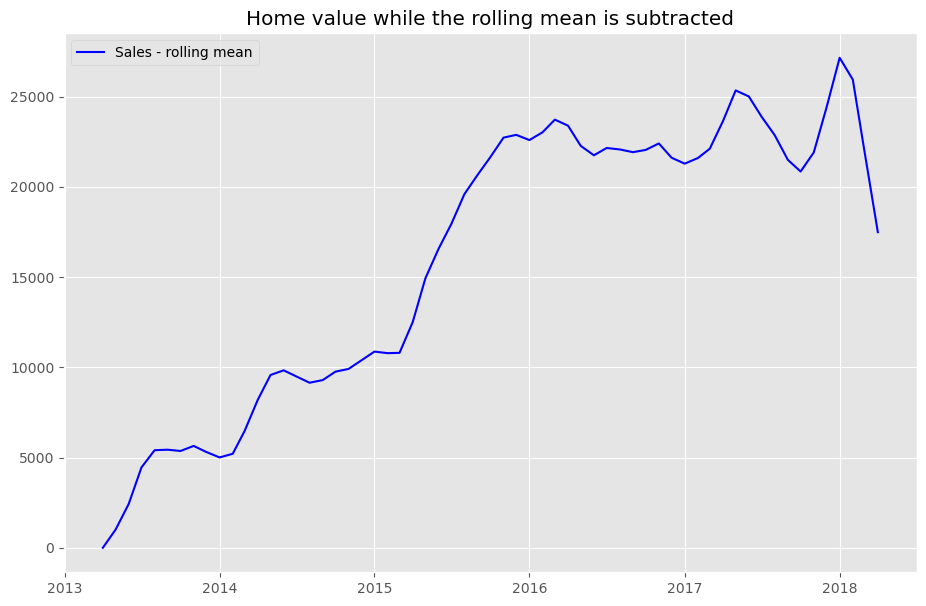

In [48]:
# Subtract the moving average from the original data
zip_98168_w = zip_98168 - exp_roll_mean

fig = plt.figure(figsize=(11,7))
plt.plot(zip_98168_w, color='blue',label='Sales - rolling mean')
plt.legend(loc='best')
plt.title('Home value while the rolling mean is subtracted')
plt.show(block=False)

#### zip_98043
Let's take a look at zipcode 98043. The p-value is 0.99 which is not less than our critical value of -2.93, meaning the series is not stationary. 

In [49]:
from statsmodels.tsa.stattools import adfuller

# Perform Dickey-Fuller test:
print ('Results of Dickey-Fuller Test: \n')
dftest = adfuller(zip_98043['value'])

# Extract and display test results in a user friendly manner
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Results of Dickey-Fuller Test: 

Test Statistic                  2.357547
p-value                         0.998989
#Lags Used                      6.000000
Number of Observations Used    42.000000
Critical Value (1%)            -3.596636
Critical Value (5%)            -2.933297
Critical Value (10%)           -2.604991
dtype: float64


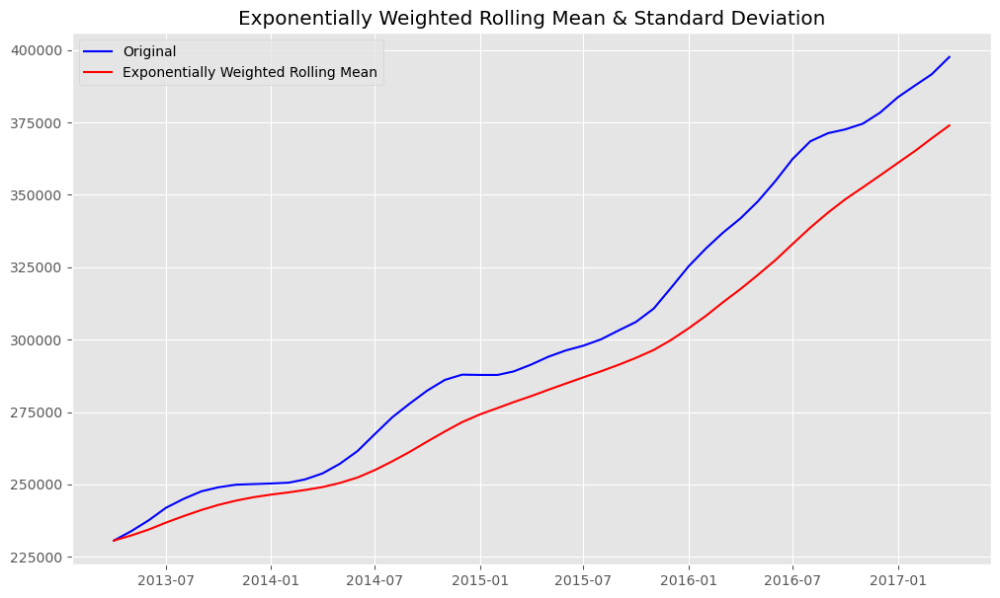

In [50]:
# Use Pandas ewm() to calculate Exponential Weighted Moving Average
exp_roll_mean = zip_98043.ewm(halflife=4).mean()

# Plot the original data with exp weighted average
fig = plt.figure(figsize=(12,7))
orig = plt.plot(zip_98043, color='blue',label='Original')
mean = plt.plot(exp_roll_mean, color='red', label='Exponentially Weighted Rolling Mean')
plt.legend(loc='best')
plt.title('Exponentially Weighted Rolling Mean & Standard Deviation')
plt.show(block=False)

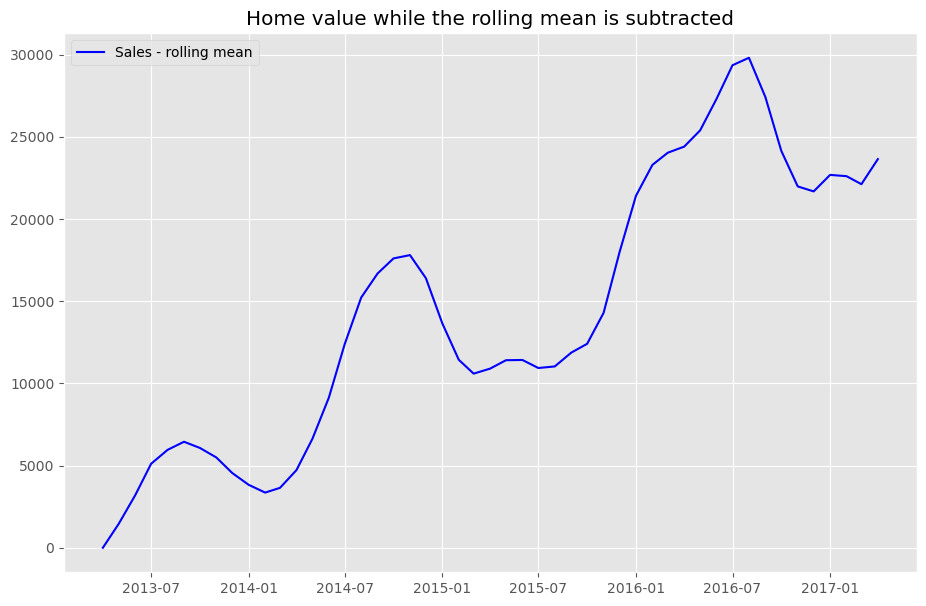

In [51]:
# Subtract the moving average from the original data
zip_98043_w = zip_98043 - exp_roll_mean

fig = plt.figure(figsize=(11,7))
plt.plot(zip_98043_w, color='blue',label='Sales - rolling mean')
plt.legend(loc='best')
plt.title('Home value while the rolling mean is subtracted')
plt.show(block=False)

#### zip_98146
Let's take a look at zipcode 98146. The p-value is 0.99 which is not less than our critical value of -2.95, meaning the series is not stationary. 

In [52]:
from statsmodels.tsa.stattools import adfuller

# Perform Dickey-Fuller test:
print ('Results of Dickey-Fuller Test: \n')
dftest = adfuller(zip_98146['value'])

# Extract and display test results in a user friendly manner
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Results of Dickey-Fuller Test: 

Test Statistic                  1.563296
p-value                         0.997743
#Lags Used                     10.000000
Number of Observations Used    32.000000
Critical Value (1%)            -3.653520
Critical Value (5%)            -2.957219
Critical Value (10%)           -2.617588
dtype: float64


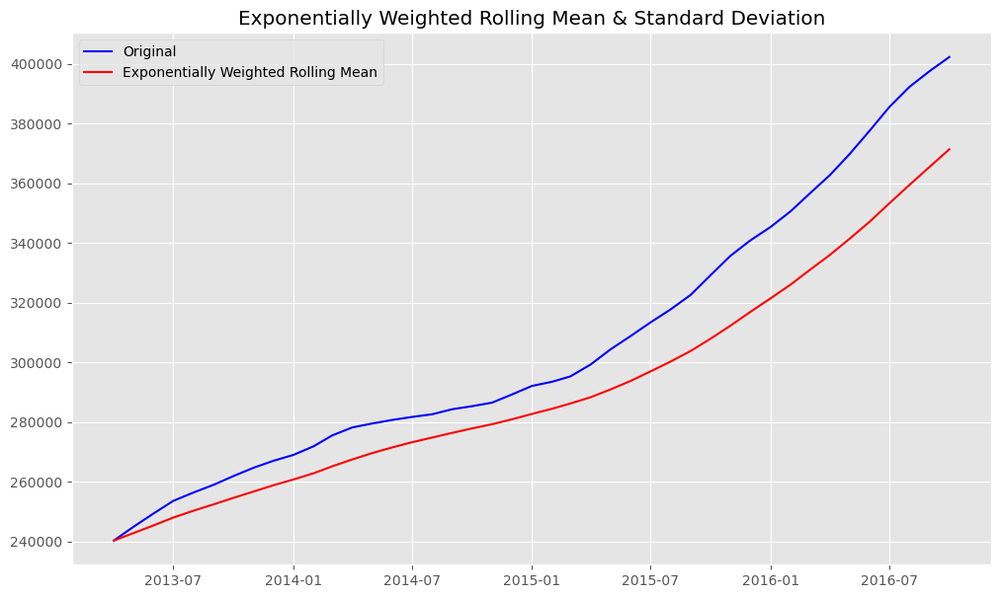

In [53]:
# Use Pandas ewm() to calculate Exponential Weighted Moving Average
exp_roll_mean = zip_98146.ewm(halflife=4).mean()

# Plot the original data with exp weighted average
fig = plt.figure(figsize=(12,7))
orig = plt.plot(zip_98146, color='blue',label='Original')
mean = plt.plot(exp_roll_mean, color='red', label='Exponentially Weighted Rolling Mean')
plt.legend(loc='best')
plt.title('Exponentially Weighted Rolling Mean & Standard Deviation')
plt.show(block=False)

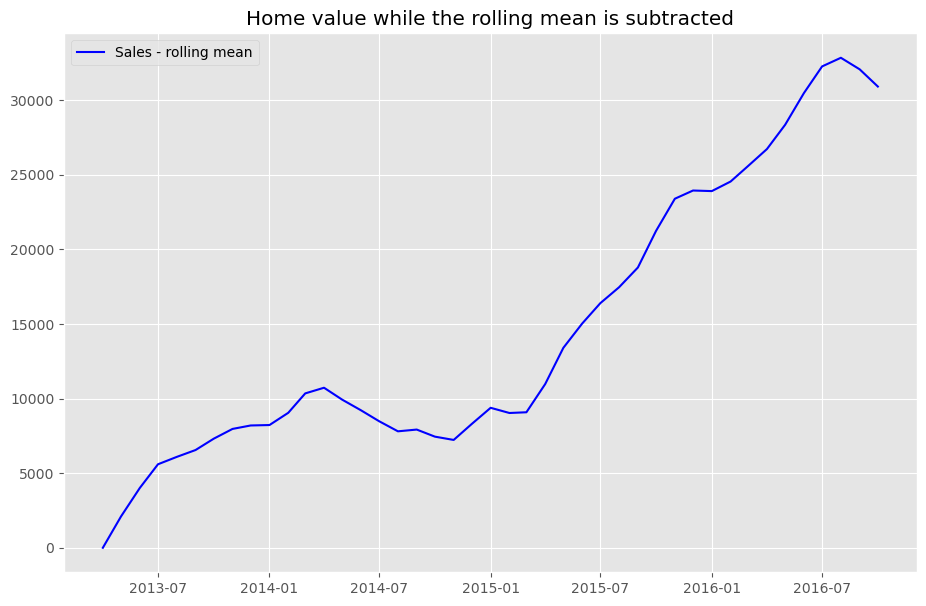

In [54]:
# Subtract the moving average from the original data
zip_98146_w = zip_98146 - exp_roll_mean

fig = plt.figure(figsize=(11,7))
plt.plot(zip_98146_w, color='blue',label='Sales - rolling mean')
plt.legend(loc='best')
plt.title('Home value while the rolling mean is subtracted')
plt.show(block=False)

#### zip_98251
Let's take a look at zipcode 98251. The p-value is 0.99 which is not less than our critical value of -2.91, meaning the series is not stationary. 

In [55]:
from statsmodels.tsa.stattools import adfuller

# Perform Dickey-Fuller test:
print ('Results of Dickey-Fuller Test: \n')
dftest = adfuller(zip_98251['value'])

# Extract and display test results in a user friendly manner
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Results of Dickey-Fuller Test: 

Test Statistic                  2.293201
p-value                         0.998951
#Lags Used                      3.000000
Number of Observations Used    57.000000
Critical Value (1%)            -3.550670
Critical Value (5%)            -2.913766
Critical Value (10%)           -2.594624
dtype: float64


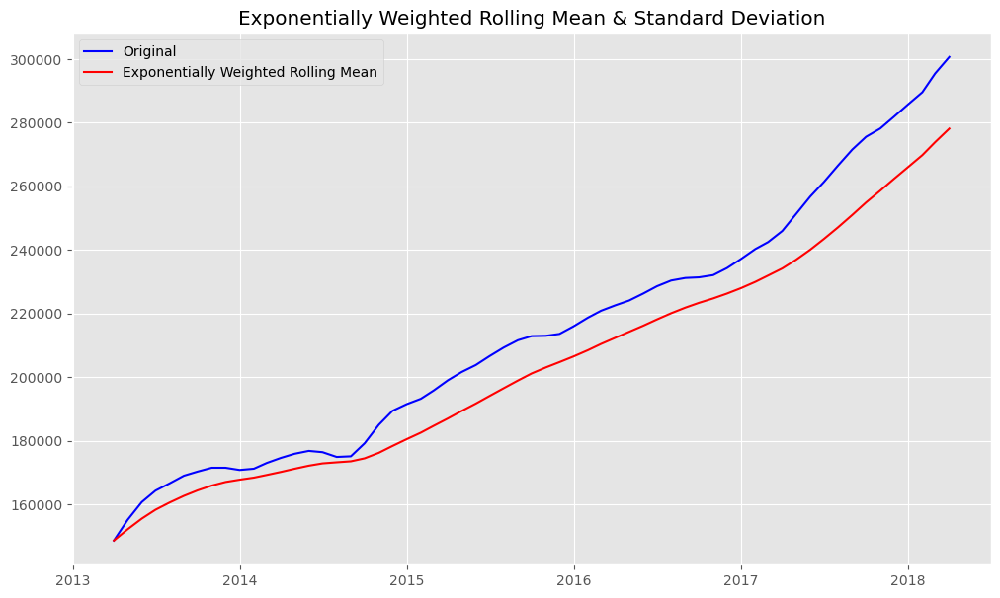

In [56]:
# Use Pandas ewm() to calculate Exponential Weighted Moving Average
exp_roll_mean = zip_98251.ewm(halflife=4).mean()

# Plot the original data with exp weighted average
fig = plt.figure(figsize=(12,7))
orig = plt.plot(zip_98251, color='blue',label='Original')
mean = plt.plot(exp_roll_mean, color='red', label='Exponentially Weighted Rolling Mean')
plt.legend(loc='best')
plt.title('Exponentially Weighted Rolling Mean & Standard Deviation')
plt.show(block=False)

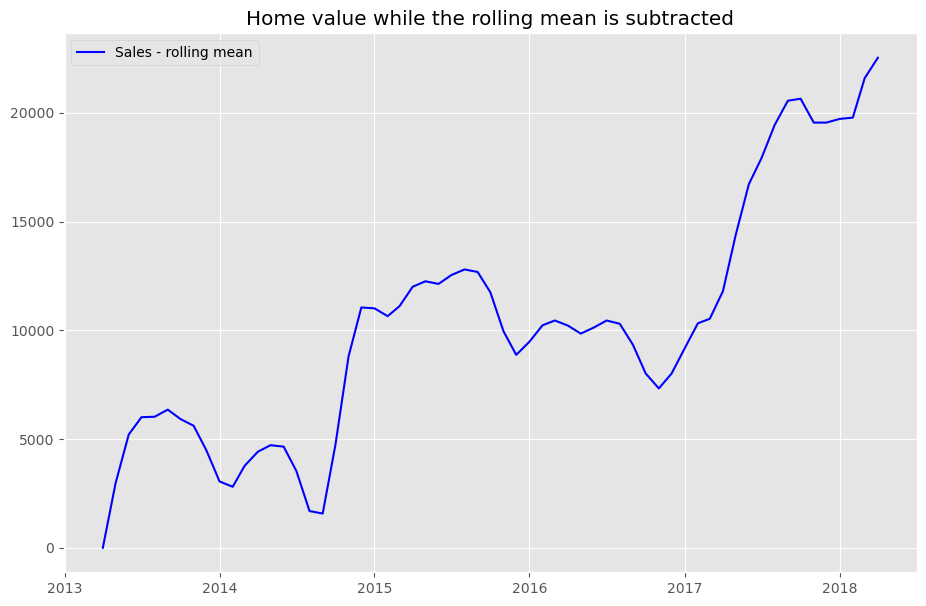

In [57]:
# Subtract the moving average from the original data
zip_98251_w = zip_98251 - exp_roll_mean

fig = plt.figure(figsize=(11,7))
plt.plot(zip_98251_w, color='blue',label='Sales - rolling mean')
plt.legend(loc='best')
plt.title('Home value while the rolling mean is subtracted')
plt.show(block=False)

#### zip_98294

Let's take a look at zipcode 98294. The p-value is 0.99 which is not less than our critical value of -2.91, meaning the series is not stationary. 

In [58]:
from statsmodels.tsa.stattools import adfuller

# Perform Dickey-Fuller test:
print ('Results of Dickey-Fuller Test: \n')
dftest = adfuller(zip_98294['value'])

# Extract and display test results in a user friendly manner
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

Results of Dickey-Fuller Test: 

Test Statistic                  2.674190
p-value                         0.999085
#Lags Used                      3.000000
Number of Observations Used    57.000000
Critical Value (1%)            -3.550670
Critical Value (5%)            -2.913766
Critical Value (10%)           -2.594624
dtype: float64


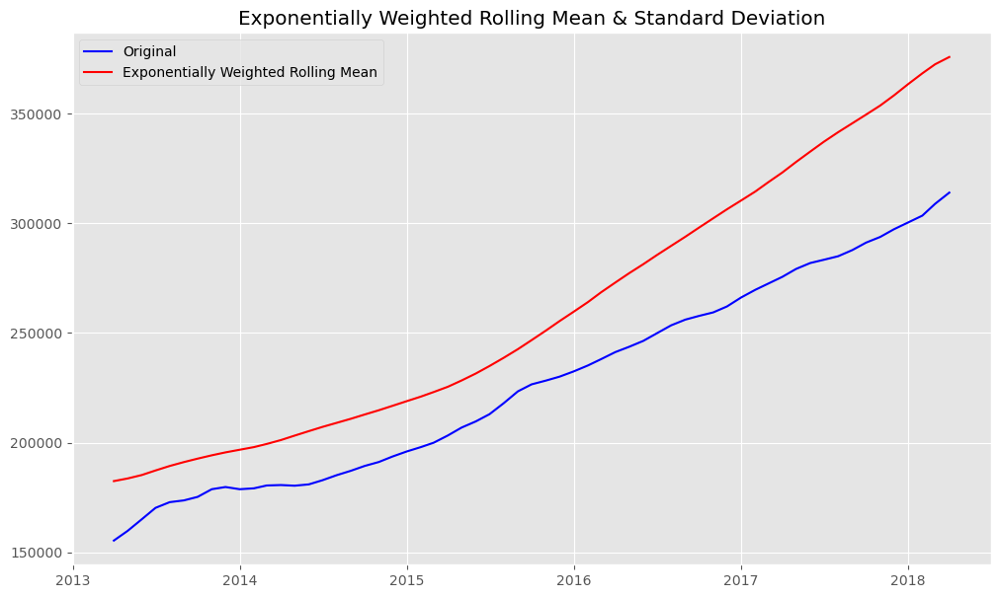

In [59]:
# Use Pandas ewm() to calculate Exponential Weighted Moving Average
exp_roll_mean = zip_98168.ewm(halflife=4).mean()

# Plot the original data with exp weighted average
fig = plt.figure(figsize=(12,7))
orig = plt.plot(zip_98294, color='blue',label='Original')
mean = plt.plot(exp_roll_mean, color='red', label='Exponentially Weighted Rolling Mean')
plt.legend(loc='best')
plt.title('Exponentially Weighted Rolling Mean & Standard Deviation')
plt.show(block=False)

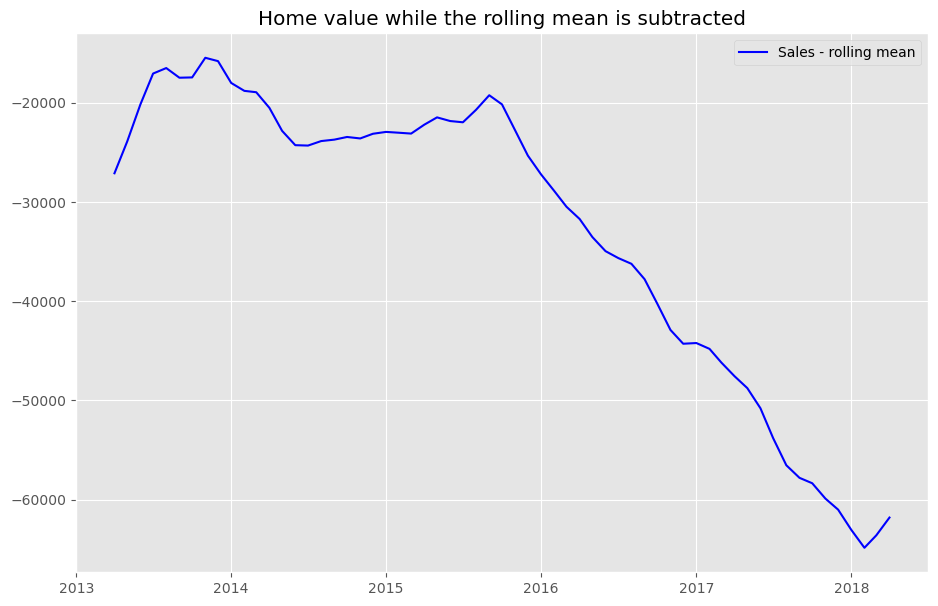

In [60]:
# Subtract the moving average from the original data
zip_98294_w = zip_98294 - exp_roll_mean

fig = plt.figure(figsize=(11,7))
plt.plot(zip_98294_w, color='blue',label='Sales - rolling mean')
plt.legend(loc='best')
plt.title('Home value while the rolling mean is subtracted')
plt.show(block=False)

### Weighted Zipcode Analysis 

In [61]:
zip_all_w = [zip_98168_w, zip_98043_w, zip_98146_w, zip_98251_w, zip_98294_w]
zip_names = ['98168', '98043', '98146', '98251', '98294']
zip_df_w = pd.concat(zip_all_w, axis = 1)
zip_df_w.columns = zip_names
zip_df_w.corr()

,98168,98043,98146,98251,98294
98168,1.000000,0.854538,0.931114,0.710504,-0.698635
98043,0.854538,1.000000,0.856568,0.525423,-0.783420
98146,0.931114,0.856568,1.000000,0.579721,-0.776041
98251,0.710504,0.525423,0.579721,1.000000,-0.788708
98294,-0.698635,-0.783420,-0.776041,-0.788708,1.000000


In [70]:
# Perform backward filling of missing values
zip_df_w['98043'] = zip_df_w['98043'].ffill()
zip_df_w['98146'] = zip_df_w['98146'].ffill()
# Find the total number of missing values in the time series
zip_df_w.isna().sum()

98168    0
98043    0
98146    0
98251    0
98294    0
dtype: int64

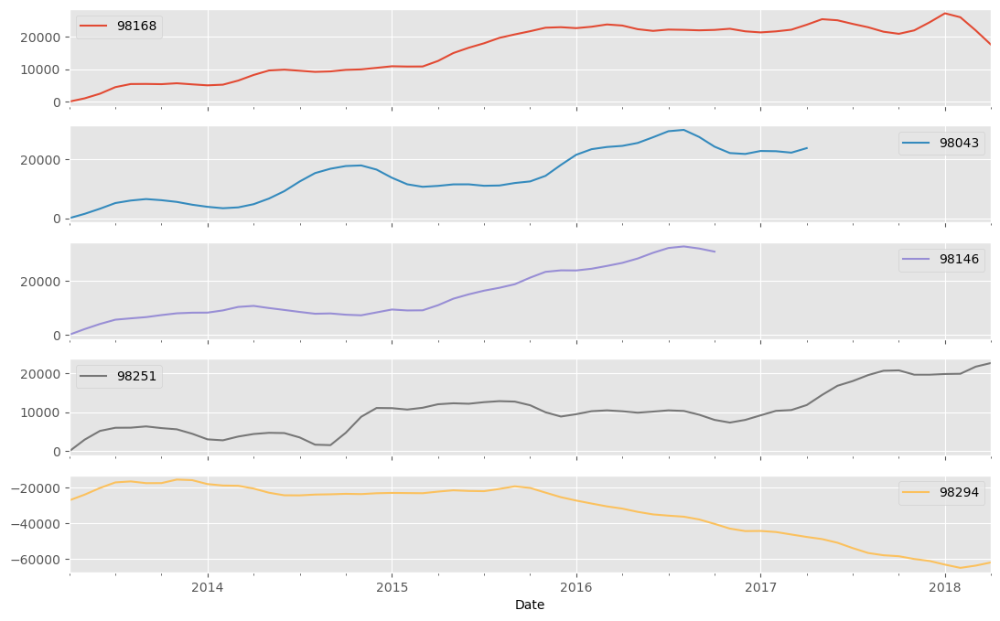

In [62]:
zip_df_w.plot(figsize=(13,8), subplots=True, legend=True);

#### ACF and PACF

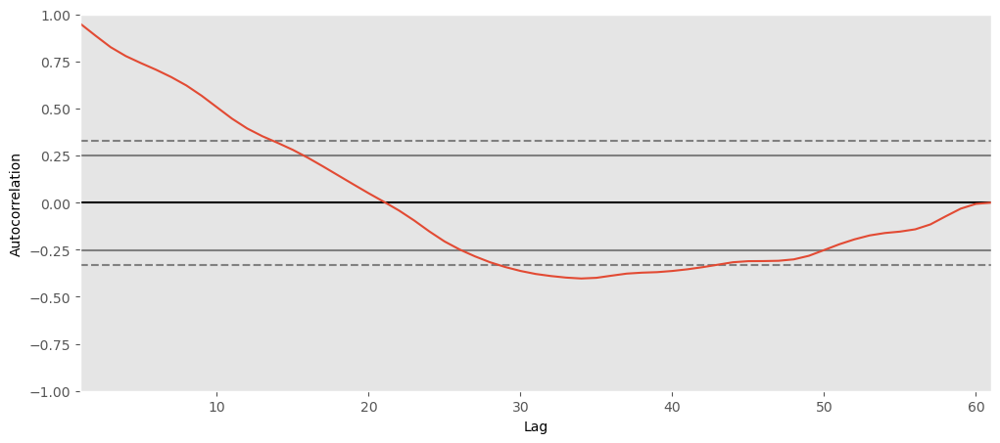

In [63]:
plt.figure(figsize=(12,5))
pd.plotting.autocorrelation_plot(zip_98168_w);
# Don't see spikes for yearly correlations

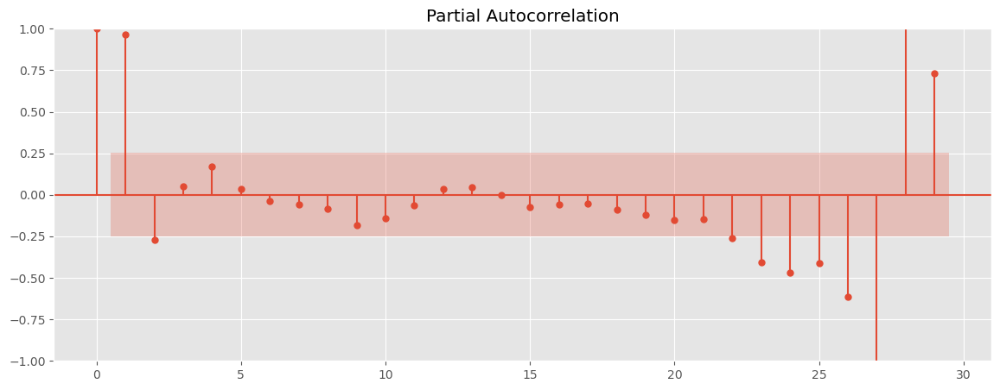

In [64]:
from statsmodels.graphics.tsaplots import plot_pacf
from matplotlib.pylab import rcParams

rcParams['figure.figsize'] = 14, 5

plot_pacf(zip_98168_w, lags=29);

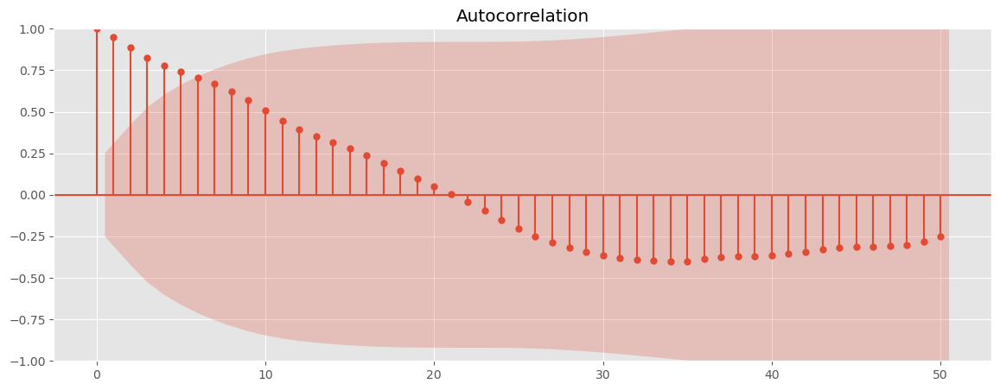

In [65]:
from statsmodels.graphics.tsaplots import plot_acf

rcParams['figure.figsize'] = 14, 5

plot_acf(zip_98168_w, lags=50);

### Train/Test Split

When doing a train/test split on timeseries you cannot randomly split the data seeing as its time sensitive. Hence, in this case we will make our training data from our first 4 years of data and our testing data from our last year of data. 

In [101]:
#Creating training data based on 2013-04-01 to 2017-04-01
train = zip_df_w['2013-04-01': '2017-04-01']
zip_98168_train = zip_98168_w['2013-04-01': '2017-04-01']
zip_98043_train = zip_98043_w['2013-04-01': '2017-04-01']
zip_98146_train = zip_98146_w['2013-04-01': '2017-04-01']
zip_98251_train = zip_98251_w['2013-04-01': '2017-04-01']
zip_98294_train = zip_98294_w['2013-04-01': '2017-04-01']

#Creating test data based on the last year of our
test = zip_df_w['2017-04-01':]
zip_98168_test = zip_98168_w['2017-04-01':]
zip_98043_test = zip_98168_w['2017-04-01':]
zip_98146_test = zip_98168_w['2017-04-01':]
zip_98251_test = zip_98168_w['2017-04-01':]
zip_98294_test = zip_98168_w['2017-04-01':]

### Create a dataframe to store the model's metrics

In [89]:
metrics = ['Name', 'Order', 'Seasonal_Order', 'Fit_Time', 
                  'Const', 'ar.L1', 'ma.L1', 'sigma2', 'AIC Score']
metrics_df = pd.DataFrame(columns = metrics)

### Baseline model

In [103]:
# In order for this cell to run, you may need to install pmdarima if you haven't already.
import pmdarima as pm

auto_model = pm.auto_arima(zip_98168_train, start_p=0, start_q=0,
                     test='adf',
                     max_p=5, max_q=5,
                     m=1,
                     d=0,
                     seasonal = True,
                     start_P=0,start_Q=0,
                     D=0,
                     trace=True,
                     error_action= 'ignore',
                     suppress_warnings=True,
                     stepwise=True,with_intercept=False)



print(auto_model.summary())


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1090.461, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=782.657, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=772.303, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.04 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=inf, Time=0.07 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=769.341, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=771.299, Time=0.06 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=772.930, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=770.575, Time=0.08 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0]          
Total fit time: 0.780 secon

In [104]:
#Identifying the order values for our model
auto_model.order

(1, 0, 2)

In [105]:
#Identifying the Seasonal Order values for our model
auto_model.seasonal_order

(0, 0, 0, 0)

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0233      0.016     64.619      0.000       0.992       1.054
ma.L1          1.3484      0.168      8.041      0.000       1.020       1.677
ma.L2          0.6856      0.147      4.659      0.000       0.397       0.974
sigma2      2.753e+05   5.98e+04      4.606      0.000    1.58e+05    3.92e+05


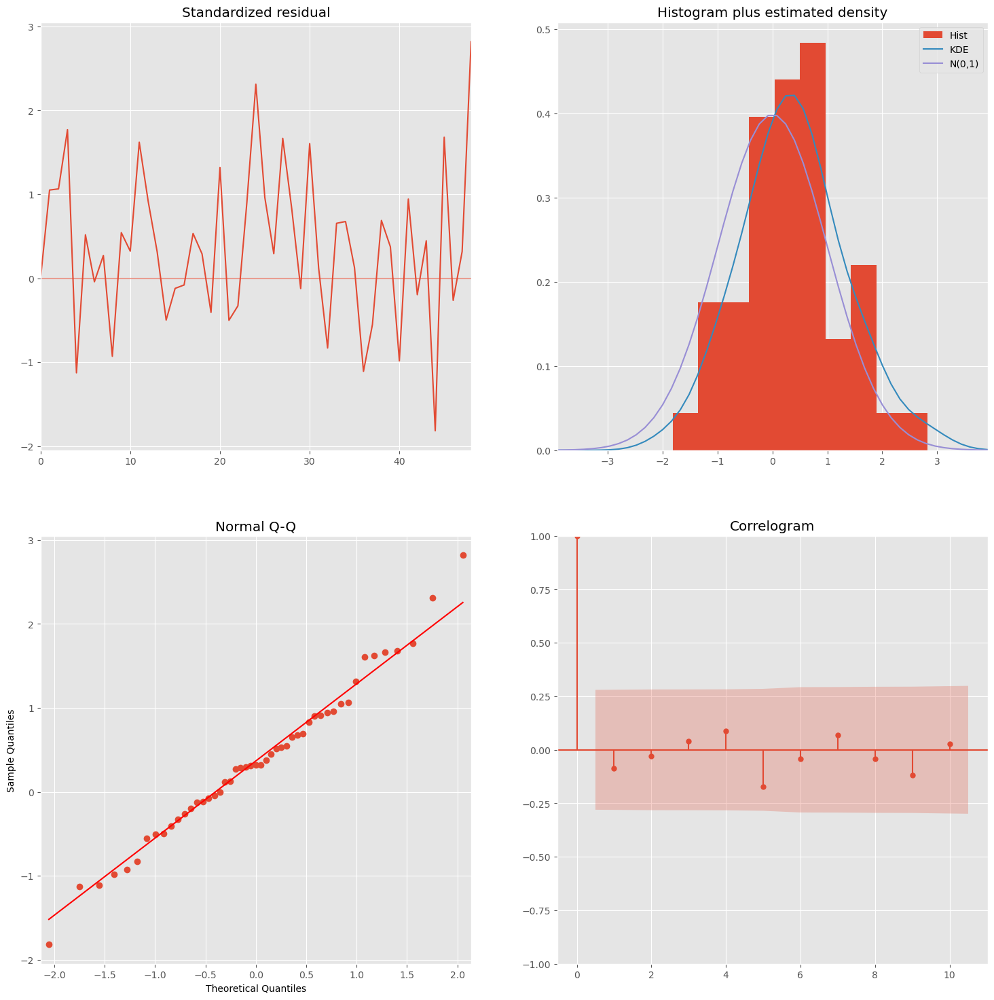

In [106]:
# Plug the optimal parameter values into a new SARIMAX model
ARIMA_MODEL = sm.tsa.statespace.SARIMAX(zip_98168_train, 
                                        order=(1,0,2), 
                                        seasonal_order=(0, 0, 0, 0), 
                                        enforce_stationarity=False, 
                                        enforce_invertibility=False)

# Fit the model and print results
output = ARIMA_MODEL.fit()

print(output.summary().tables[1])
auto_model.plot_diagnostics(figsize=(18,18))
plt.show()

In [107]:
# Get predictions starting from 04-01-2015 and calculate confidence intervals
pred = output.get_prediction(start=pd.to_datetime('2017-04'), end=pd.to_datetime('2018-04'), dynamic=False)
pred_conf = pred.conf_int()
pred_conf

,lower value,upper value
2017-04-01,21347.681830,23404.470383
2017-05-01,24854.748541,26911.537093
2017-06-01,24705.616758,29999.572030
2017-07-01,23837.210779,32144.511254
2017-08-01,23354.134836,33933.908057
2017-09-01,23049.867717,35574.978739
2017-10-01,22855.915520,37136.928509
2017-11-01,22739.646043,38653.117474
2017-12-01,22682.596818,40142.752992
2018-01-01,22673.187509,41618.177673


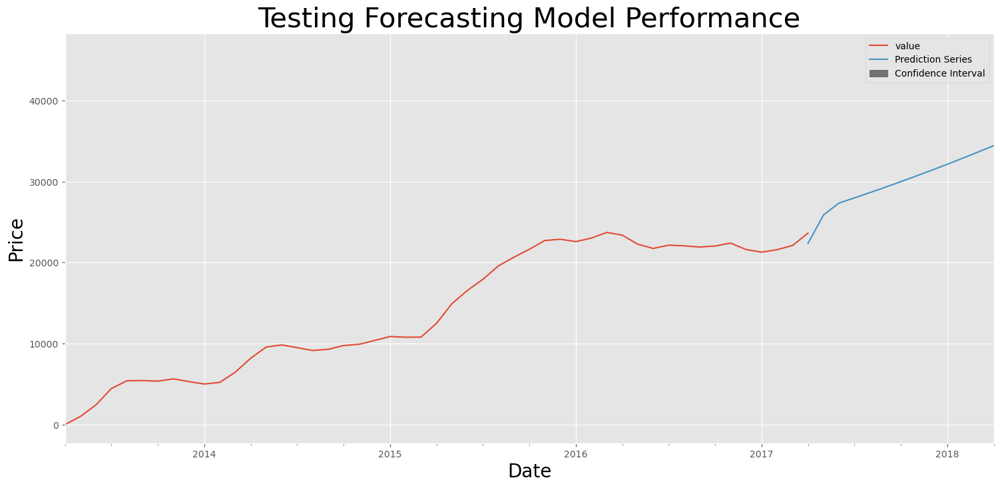

In [112]:
# Plot real vs predicted values along with confidence interval

rcParams['figure.figsize'] = 18, 8

# Plot observed values
ax = zip_98168_train.plot(label='observed')

# Plot predicted values
pred.predicted_mean.plot(ax=ax, label='Prediction Series', alpha=0.9)

# Plot the range for confidence intervals
ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1], color='black', alpha=0.5,label = 'Confidence Interval')

# Set axes labels
ax.set_xlabel('Date',fontsize=20)
ax.set_ylabel('Price',fontsize=20)
ax.set_title('Testing Forecasting Model Performance',fontsize=30)
plt.legend()

plt.show()